### FB Prophet

In [22]:
import numpy as np
import pandas as pd
from pandas_datareader import data as wb
import matplotlib.pyplot as plt
from prophet import Prophet
from pandas_datareader import data as pdr
import yfinance as yfin
yfin.pdr_override()
import datetime as dt
import seaborn as sns
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error


In [23]:
import plotly
import plotly.graph_objs as go
plt.style.use('fivethirtyeight')
import warnings
warnings.filterwarnings("ignore")

In [24]:
df = pd.read_csv("usa_combined.csv")

In [25]:
df

,reference_year,model_year,fuel_type,ef,pollutant,lower_speed_interval,upper_speed_interval,data_from
0,2010,1982,D,0.349365,CH4,0.0,8.0,usa_emfac
1,2010,1982,D,0.263701,CH4,9.0,16.0,usa_emfac
2,2010,1982,D,0.133710,CH4,17.0,24.0,usa_emfac
3,2010,1982,D,0.058837,CH4,25.0,32.0,usa_emfac
4,2010,1982,D,0.040486,CH4,33.0,40.0,usa_emfac
...,...,...,...,...,...,...,...,...
277337,2022,2022,G,0.048129,VOC,84.5,92.5,usa_moves
277338,2022,2022,G,0.053466,VOC,92.5,100.6,usa_moves
277339,2022,2022,G,0.088261,VOC,100.6,108.6,usa_moves
277340,2022,2022,G,0.120495,VOC,108.6,116.7,usa_moves


In [26]:
from datetime import datetime, timedelta
# generate random Month and Day columns
df['Month'] = np.random.randint(1, 13, size=len(df))
df['Day'] = np.random.randint(1, 32, size=len(df))

# create datetime objects from reference_year, Month, and Day columns
dates = []
for i in range(len(df)):
    try:
        date = datetime(df.loc[i, 'reference_year'], df.loc[i, 'Month'], df.loc[i, 'Day'])
    except ValueError:
        # if the day is out of range for the given month, set the day to the last day of the month
        date = datetime(df.loc[i, 'reference_year'], df.loc[i, 'Month'], 1) + timedelta(days=30)
    dates.append(date)

# add the new dates column to the DataFrame
df['Date'] = dates

In [27]:
df

,reference_year,model_year,fuel_type,ef,pollutant,lower_speed_interval,upper_speed_interval,data_from,Month,Day,Date
0,2010,1982,D,0.349365,CH4,0.0,8.0,usa_emfac,10,12,2010-10-12
1,2010,1982,D,0.263701,CH4,9.0,16.0,usa_emfac,4,8,2010-04-08
2,2010,1982,D,0.133710,CH4,17.0,24.0,usa_emfac,7,14,2010-07-14
3,2010,1982,D,0.058837,CH4,25.0,32.0,usa_emfac,1,12,2010-01-12
4,2010,1982,D,0.040486,CH4,33.0,40.0,usa_emfac,11,20,2010-11-20
...,...,...,...,...,...,...,...,...,...,...,...
277337,2022,2022,G,0.048129,VOC,84.5,92.5,usa_moves,8,29,2022-08-29
277338,2022,2022,G,0.053466,VOC,92.5,100.6,usa_moves,5,16,2022-05-16
277339,2022,2022,G,0.088261,VOC,100.6,108.6,usa_moves,1,22,2022-01-22
277340,2022,2022,G,0.120495,VOC,108.6,116.7,usa_moves,9,13,2022-09-13


In [28]:
# apply log transformation on the ef column
df['log_ef'] = np.log(df['ef'] - df['ef'].min() + 1)
df['log_ef1'] = np.log(df['log_ef'] - df['log_ef'].min() + 1)
df['log_ef2'] = np.log(df['log_ef1'] - df['log_ef1'].min() + 1)
df['log_ef3'] = np.log(df['log_ef2'] - df['log_ef2'].min() + 1)

In [29]:
#print (f"start date : {str(df.index.min())}")
#print (f"end date : {str(df.index.max())}")

In [30]:
# Add Two new columans ds & Y (closing price ( we will do forecasting on this price) for y and date for ds.)
df=df.reset_index()
df[['ds','y']]= df[['Date','log_ef3']]

In [31]:
df

,index,reference_year,model_year,fuel_type,ef,pollutant,lower_speed_interval,upper_speed_interval,data_from,Month,Day,Date,log_ef,log_ef1,log_ef2,log_ef3,ds,y
0,0,2010,1982,D,0.349365,CH4,0.0,8.0,usa_emfac,10,12,2010-10-12,0.299627,0.262077,0.232759,0.209255,2010-10-12,0.209255
1,1,2010,1982,D,0.263701,CH4,9.0,16.0,usa_emfac,4,8,2010-04-08,0.234037,0.210291,0.190861,0.174676,2010-04-08,0.174676
2,2,2010,1982,D,0.133710,CH4,17.0,24.0,usa_emfac,7,14,2010-07-14,0.125487,0.118216,0.111734,0.105921,2010-07-14,0.105921
3,3,2010,1982,D,0.058837,CH4,25.0,32.0,usa_emfac,1,12,2010-01-12,0.057162,0.055588,0.054098,0.052685,2010-01-12,0.052685
4,4,2010,1982,D,0.040486,CH4,33.0,40.0,usa_emfac,11,20,2010-11-20,0.039678,0.038911,0.038173,0.037463,2010-11-20,0.037463
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
277337,277337,2022,2022,G,0.048129,VOC,84.5,92.5,usa_moves,8,29,2022-08-29,0.046997,0.045926,0.044903,0.043924,2022-08-29,0.043924
277338,277338,2022,2022,G,0.053466,VOC,92.5,100.6,usa_moves,5,16,2022-05-16,0.052076,0.050766,0.049519,0.048332,2022-05-16,0.048332
277339,277339,2022,2022,G,0.088261,VOC,100.6,108.6,usa_moves,1,22,2022-01-22,0.084572,0.081185,0.078058,0.075161,2022-01-22,0.075161
277340,277340,2022,2022,G,0.120495,VOC,108.6,116.7,usa_moves,9,13,2022-09-13,0.113762,0.107743,0.102325,0.097421,2022-09-13,0.097421


In [32]:
# drop the columans
ph_df=df.drop(['index','reference_year','model_year','fuel_type','ef','pollutant','lower_speed_interval','upper_speed_interval','data_from','Date','reference_year','log_ef','log_ef1','log_ef2','log_ef3','Month','Day'], axis=1)

In [33]:
ph_df.head()

,ds,y
0,2010-10-12,0.209255
1,2010-04-08,0.174676
2,2010-07-14,0.105921
3,2010-01-12,0.052685
4,2010-11-20,0.037463


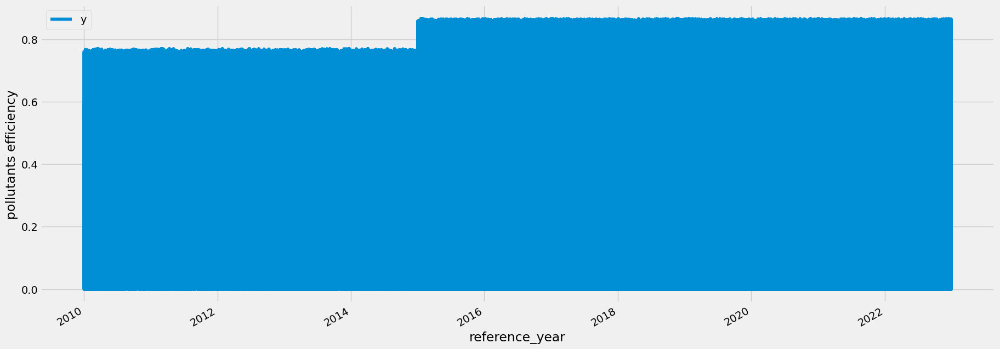

In [34]:
ax = ph_df.set_index('ds').plot(figsize=(20, 8))
ax.set_ylabel('pollutants efficiency')
ax.set_xlabel('reference_year')

plt.show()

In [35]:
import plotly.express as px
fig = go.Figure([go.Scatter(x=ph_df['ds'], y=ph_df['y'])])
fig.update_layout(title_text="Emission Actual")
fig.update_xaxes(title_text="Timeline")
fig.update_yaxes(title_text="Emission Factor")
fig.show()

In [36]:
model = Prophet(yearly_seasonality=True)
model.fit(ph_df)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmnejp2cu/d9036__9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpmnejp2cu/fyalafwd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.9/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76521', 'data', 'file=/tmp/tmpmnejp2cu/d9036__9.json', 'init=/tmp/tmpmnejp2cu/fyalafwd.json', 'output', 'file=/tmp/tmpmnejp2cu/prophet_model5hkpopy7/prophet_model-20230414203849.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:38:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:40:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [37]:
future=model.make_future_dataframe(periods=365,freq='D')

In [38]:
predictions=model.predict(future)

In [39]:
predictions.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
5108,2023-12-27,0.272353,-0.102125,0.627693,0.266235,0.279019,0.000222,0.000222,0.000222,-0.001153,-0.001153,-0.001153,0.001376,0.001376,0.001376,0.0,0.0,0.0,0.272576
5109,2023-12-28,0.272369,-0.070117,0.616530,0.266230,0.279061,0.003462,0.003462,0.003462,0.001614,0.001614,0.001614,0.001848,0.001848,0.001848,0.0,0.0,0.0,0.275831
5110,2023-12-29,0.272385,-0.087769,0.634058,0.266212,0.279089,0.002362,0.002362,0.002362,0.000126,0.000126,0.000126,0.002236,0.002236,0.002236,0.0,0.0,0.0,0.274746
5111,2023-12-30,0.272400,-0.069547,0.627370,0.266202,0.279144,0.001566,0.001566,0.001566,-0.000965,-0.000965,-0.000965,0.002531,0.002531,0.002531,0.0,0.0,0.0,0.273966
5112,2023-12-31,0.272416,-0.078583,0.633237,0.266193,0.279187,0.000693,0.000693,0.000693,-0.002035,-0.002035,-0.002035,0.002728,0.002728,0.002728,0.0,0.0,0.0,0.273109


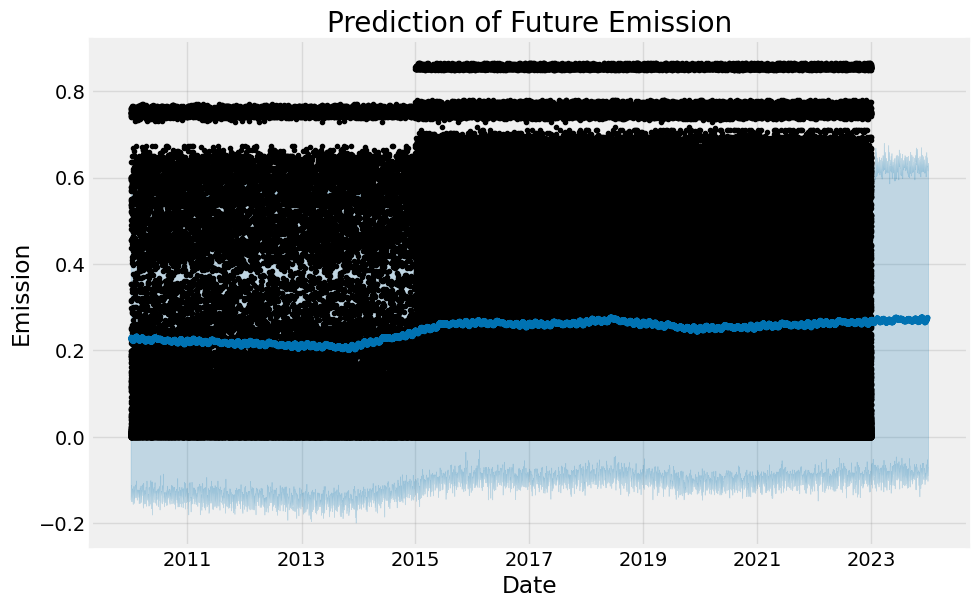

,ds,yhat,yhat_lower,yhat_upper
5108,2023-12-27,0.272576,-0.102125,0.627693
5109,2023-12-28,0.275831,-0.070117,0.616530
5110,2023-12-29,0.274746,-0.087769,0.634058
5111,2023-12-30,0.273966,-0.069547,0.627370
5112,2023-12-31,0.273109,-0.078583,0.633237


In [40]:
model.plot(predictions)
plt.title("Prediction of Future Emission")
plt.xlabel("Date")
plt.ylabel("Emission")
plt.show()
predictions[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

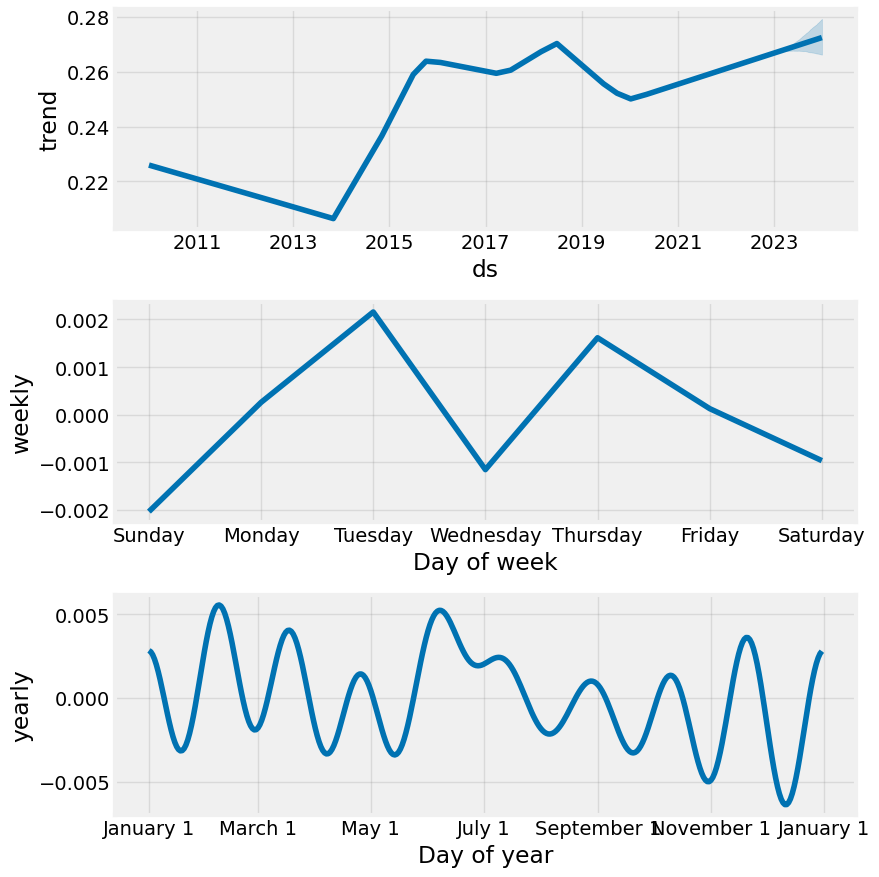

In [41]:
model.plot_components(predictions)
plt.show()